<a href="https://colab.research.google.com/github/gudipatiharitha/GlossaryDocument/blob/master/tutorials/intro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[`pyannote.audio`](https://github.com/pyannote/pyannote-audio) is an open-source toolkit written in Python for **speaker diarization**.

Based on [`PyTorch`](https://pytorch.org) machine learning framework, it provides a set of trainable end-to-end neural building blocks that can be combined and jointly optimized to build speaker diarization pipelines.

`pyannote.audio` also comes with pretrained [models](https://huggingface.co/models?other=pyannote-audio-model) and [pipelines](https://huggingface.co/models?other=pyannote-audio-pipeline) covering a wide range of domains for voice activity detection, speaker segmentation, overlapped speech detection, speaker embedding reaching state-of-the-art performance for most of them.

**This notebook will teach you how to apply those pretrained pipelines on your own data.**

Make sure you run it using a GPU (or it might otherwise be slow...)

## Installation

In [1]:
!pip install -qq pyannote.audio==3.1.1
!pip install -qq ipython==7.34.0

# Visualization with `pyannote.core`

For the purpose of this notebook, we will download and use an audio file coming from the [AMI corpus](http://groups.inf.ed.ac.uk/ami/corpus/), which contains a conversation between 4 people in a meeting room.

In [2]:
# Assuming a file like 'ES2004a.Mix-Headset.wav' is uploaded
from google.colab import files
uploaded = files.upload()
file_name = list(uploaded.keys())[0]

# Use it in your code
DEMO_FILE = {
    'uri': file_name.replace('.wav', ''),
    'audio': file_name
}
#!wget -q http://groups.inf.ed.ac.uk/ami/AMICorpusMirror/amicorpus/ES2004a/audio/ES2004a.Mix-Headset.wav
#DEMO_FILE = {'uri': 'ES2004a.Mix-Headset', 'audio': 'ES2004a.Mix-Headset.wav'}

Saving 8a7a5685-8bd8-4ea7-beb5-d2f29abfb887.mp3 to 8a7a5685-8bd8-4ea7-beb5-d2f29abfb887 (1).mp3


Because AMI is a benchmarking dataset, it comes with manual annotations (a.k.a *groundtruth*).  
Let us load and visualize the expected output of the speaker diarization pipeline.


In [ ]:
!wget -q https://raw.githubusercontent.com/pyannote/AMI-diarization-setup/main/only_words/rttms/test/ES2004a.rttm

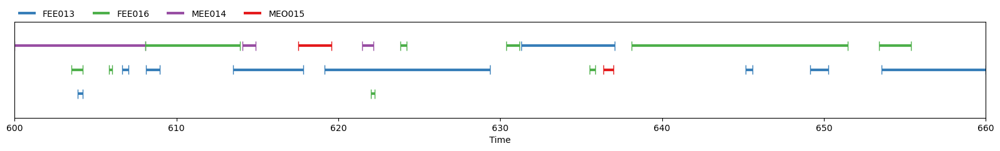

In [ ]:
# load groundtruth
from pyannote.database.util import load_rttm
_, groundtruth = load_rttm('ES2004a.rttm').popitem()

# visualize groundtruth
groundtruth

For the rest of this notebook, we will only listen to and visualize a one-minute long excerpt of the file (but will process the whole file anyway).

In [10]:
from pyannote.core import Segment, notebook
# make notebook visualization zoom on 600s < t < 660s time range
EXCERPT = Segment(100, 200)
notebook.crop = EXCERPT

# visualize excerpt groundtruth
#groundtruth

This nice visualization is brought to you by [`pyannote.core`](http://pyannote.github.io/pyannote-core/) and basically indicates when each speaker speaks.

In [11]:
!pip install numpy==1.24.4 --quiet
#import os
#os.kill(os.getpid(), 9)  # Restart the Colab runtime (required for downgrade to take effect)
from pyannote.audio import Audio
from IPython.display import Audio as IPythonAudio
waveform, sr = Audio(mono="downmix").crop(DEMO_FILE, EXCERPT)
IPythonAudio(waveform.flatten(), rate=sr)

# Processing your own audio file (optional)

In case you just want to go ahead with the demo file, skip this section entirely.

In case you want to try processing your own audio file, proceed with running this section. It will offer you to upload an audio file (preferably a `wav` file but all formats supported by [`SoundFile`](https://pysoundfile.readthedocs.io/en/latest/) should work just fine).

## Upload audio file

In [ ]:
import google.colab
own_file, _ = google.colab.files.upload().popitem()
OWN_FILE = {'audio': own_file}
notebook.reset()

# load audio waveform and play it
waveform, sample_rate = Audio(mono="downmix")(OWN_FILE)
IPythonAudio(data=waveform.squeeze(), rate=sample_rate, autoplay=True)

Simply replace `DEMO_FILE` by `OWN_FILE` in the rest of the notebook.

Note, however, that unless you provide a groundtruth annotation in the next cell, you will (obviously) not be able to visualize groundtruth annotation nor evaluate the performance of the diarization pipeline quantitatively

## Upload groundtruth (optional)

The groundtruth file is expected to use the RTTM format, with one line per speech turn with the following convention:

```
SPEAKER {file_name} 1 {start_time} {duration} <NA> <NA> {speaker_name} <NA> <NA>
```

Saving sample.rttm to sample.rttm


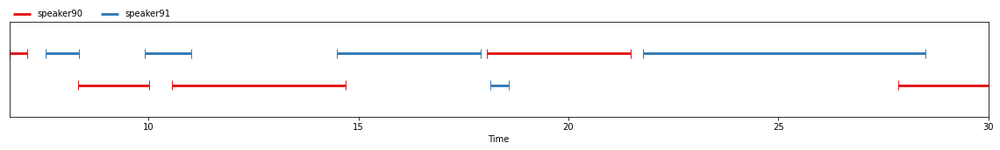

In [ ]:
groundtruth_rttm, _ = google.colab.files.upload().popitem()
groundtruths = load_rttm(groundtruth_rttm)
if OWN_FILE['audio'] in groundtruths:
  groundtruth = groundtruths[OWN_FILE['audio']]
else:
  _, groundtruth = groundtruths.popitem()
groundtruth

# Speaker diarization with `pyannote.pipeline`

We are about to run a full speaker diarization pipeline, that includes speaker segmentation, speaker embedding, and a final clustering step. **Brace yourself!**

To load the speaker diarization pipeline,

* accept the user conditions on [hf.co/pyannote/speaker-diarization-3.1](https://hf.co/pyannote/speaker-diarization-3.1)
* accept the user conditions on [hf.co/pyannote/segmentation-3.0](https://hf.co/pyannote/segmentation-3.0)
* login using `notebook_login` below

In [17]:
from huggingface_hub import notebook_login
notebook_login()

In [18]:
# load pretrained pipeline
from pyannote.audio import Pipeline
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization-3.1')

# send pipeline to GPU (when available)
import torch
if torch.cuda.is_available():
  pipeline.to(torch.device('cuda'))

# run the pipeline (with progress bar)
from pyannote.audio.pipelines.utils.hook import ProgressHook
with ProgressHook() as hook:
  diarization = pipeline(DEMO_FILE, hook=hook)

config.yaml:   0%|          | 0.00/469 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/pyannote/audio/pipelines/speaker_verification.py:43: UserWarning: torchaudio._backend.get_audio_backend has been deprecated. With dispatcher enabled, this function is no-op. You can remove the function call.
  backend = torchaudio.get_audio_backend()
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for _speechbrain_save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for _speechbrain_load
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for load
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for _save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for _recover
/usr/local/lib/python3.11/dist-packages/pyannote/audio/pipelines/speaker_verification.py:45: UserWarning: Module 'speechbrain.pretrained' was deprecated, redirecting to 'speechbrain.inference'. Please update your scr

pytorch_model.bin:   0%|          | 0.00/5.91M [00:00<?, ?B/s]

config.yaml:   0%|          | 0.00/399 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/26.6M [00:00<?, ?B/s]

config.yaml:   0%|          | 0.00/221 [00:00<?, ?B/s]

Output()

/usr/local/lib/python3.11/dist-packages/pyannote/audio/utils/reproducibility.py:74: ReproducibilityWarning: 
TensorFloat-32 (TF32) has been disabled as it might lead to reproducibility issues and lower accuracy.
It can be re-enabled by calling
   >>> import torch
   >>> torch.backends.cuda.matmul.allow_tf32 = True
   >>> torch.backends.cudnn.allow_tf32 = True
See https://github.com/pyannote/pyannote-audio/issues/1370 for more details.

  warnings.warn(

/usr/local/lib/python3.11/dist-packages/pyannote/audio/models/blocks/pooling.py:104: UserWarning: std(): degrees of
freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output 
numel). (Triggered internally at /pytorch/aten/src/ATen/native/ReduceOps.cpp:1831.)
  std = sequences.std(dim=-1, correction=1)

That's it? Yes, that's it :-)

In [20]:
diarization
for turn, _, speaker in diarization.itertracks(yield_label=True):
    print(f"Speaker {speaker}: {turn.start:.2f}s to {turn.end:.2f}s")


Speaker SPEAKER_00: 1.21s to 2.61s
Speaker SPEAKER_00: 2.79s to 5.70s
Speaker SPEAKER_01: 3.06s to 3.08s
Speaker SPEAKER_00: 5.98s to 7.12s
Speaker SPEAKER_00: 7.21s to 7.92s
Speaker SPEAKER_00: 8.85s to 11.38s
Speaker SPEAKER_00: 11.62s to 14.64s
Speaker SPEAKER_00: 15.03s to 17.99s
Speaker SPEAKER_00: 18.09s to 20.25s
Speaker SPEAKER_00: 20.37s to 20.94s
Speaker SPEAKER_00: 21.18s to 22.22s
Speaker SPEAKER_00: 22.50s to 24.34s
Speaker SPEAKER_01: 23.39s to 23.54s
Speaker SPEAKER_00: 24.52s to 26.39s
Speaker SPEAKER_01: 25.41s to 26.36s
Speaker SPEAKER_00: 26.82s to 27.94s
Speaker SPEAKER_00: 28.06s to 35.49s
Speaker SPEAKER_01: 30.09s to 34.19s
Speaker SPEAKER_00: 36.10s to 37.39s
Speaker SPEAKER_00: 37.95s to 42.30s
Speaker SPEAKER_00: 43.17s to 43.83s
Speaker SPEAKER_00: 44.32s to 47.82s
Speaker SPEAKER_01: 44.73s to 45.07s
Speaker SPEAKER_00: 48.16s to 48.67s
Speaker SPEAKER_00: 50.21s to 51.03s
Speaker SPEAKER_00: 53.76s to 54.34s
Speaker SPEAKER_00: 54.98s to 55.17s
Speaker SPEA

# Evaluation with `pyannote.metrics`

Because groundtruth is available, we can evaluate the quality of the diarization pipeline by computing the [diarization error rate](http://pyannote.github.io/pyannote-metrics/reference.html#diarization).

In [ ]:
from pyannote.metrics.diarization import DiarizationErrorRate
metric = DiarizationErrorRate()
der = metric(groundtruth, diarization)

In [ ]:
print(f'diarization error rate = {100 * der:.1f}%')

diarization error rate = 19.8%


This implementation of diarization error rate is brought to you by [`pyannote.metrics`](http://pyannote.github.io/pyannote-metrics/).

It can also be used to improve visualization by find the optimal one-to-one mapping between groundtruth and hypothesized speakers.

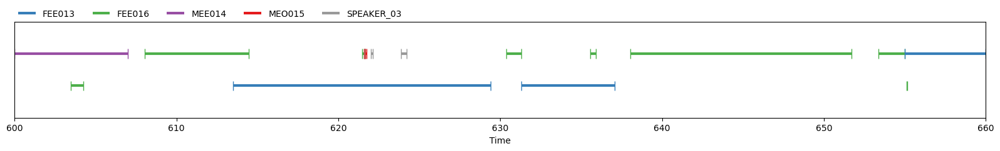

In [ ]:
mapping = metric.optimal_mapping(groundtruth, diarization)
diarization.rename_labels(mapping=mapping)

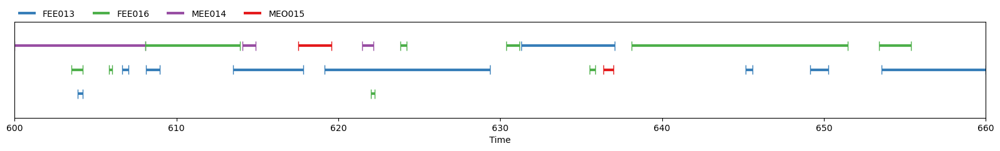

In [ ]:
groundtruth

# Going further

We have only scratched the surface in this introduction.

More details can be found in the [`pyannote.audio` Github repository](https://github.com/pyannote/pyannote-audio).
